# Environment

In [ ]:
# %pip install optionlib

  Attempting uninstall: optionlib
    Found existing installation: optionlib 0.0.1
    Uninstalling optionlib-0.0.1:
      Successfully uninstalled optionlib-0.0.1
Note: you may need to restart the kernel to use updated packages.


In [1]:
from optionlib.data import ticker, prices, earnings
from optionlib import *

In [2]:
from plotly import express as px
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn.ensemble import GradientBoostingRegressor
from joblib import Parallel, delayed
from scipy.stats import norm
from IPython.display import clear_output

# Data

## Ticker

In [3]:
data = ticker.base_data(risk_ticker='SPY')

In [4]:
data.tail()

,Open,High,Low,Close,Adj Close,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,...,pct_delta_60d,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,VIX,jobs_friday,month
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-11,459.690002,462.170013,459.470001,461.989990,460.124451,65002200,7.364650e+07,0.003890,0.008205,0.015898,...,0.041997,0.029298,0.167378,0.187665,0.431437,30.97,-0.48,12.63,0,12
2023-12-12,461.630005,464.200012,460.600006,464.100006,462.225952,68327600,7.067931e+07,0.004567,0.008475,0.012810,...,0.046142,0.038697,0.170521,0.194072,0.408854,30.97,-0.53,12.07,0,12
2023-12-13,464.489990,470.760010,464.119995,470.500000,468.600098,93278000,7.365747e+07,0.013790,0.018420,0.022382,...,0.062772,0.043909,0.189333,0.224527,0.440984,30.97,-0.42,12.19,0,12
2023-12-14,472.500000,473.730011,469.250000,472.010010,470.104004,119026000,8.069069e+07,0.003209,0.017044,0.021689,...,0.076076,0.051833,0.176056,0.239424,0.425021,30.97,-0.45,12.48,0,12
2023-12-15,469.489990,470.700012,467.429993,469.329987,469.329987,141319300,9.100420e+07,-0.005678,-0.002487,0.011269,...,0.087948,0.052900,0.162571,0.238893,0.365930,31.92,-0.53,12.28,0,12


## Earnings

In [5]:
stock = 'TSLA'
earnings = earnings.earnings_data(stock)

In [6]:
earnings.head()

,earnings_release
Date,
2010-11-09,1
2011-02-15,1
2011-05-04,1
2011-08-03,1
2011-11-02,1


## Option prices

In [5]:
prices_df = prices.option_prices('SPY','2023-12-29')

In [6]:
prices_df.head()

Contract Name         Last Trade Date  Last Price  \
put_call Strike                                                           
C        270.0   SPY231229C00270000   2023-12-11 9:37AM EST      189.90   
         275.0   SPY231229C00275000  2023-08-04 10:02AM EST      180.85   
         280.0   SPY231229C00280000   2023-11-21 1:55PM EST      174.57   
         285.0   SPY231229C00285000   2023-11-21 1:57PM EST      169.61   
         290.0   SPY231229C00290000   2023-08-21 1:16PM EST      152.98   

                    Bid     Ask  Change % Change Volume  Open Interest  \
put_call Strike                                                          
C        270.0   199.57  201.53     0.0        -     12              0   
         275.0   178.60  179.77     0.0        -      2             59   
         280.0   189.59  191.55     0.0        -     10             10   
         285.0   184.61  186.56     0.0        -     13             13   
         290.0   151.89  153.09     0.0        -      3             16   

                Implied Volatility  
put_call Strike                     
C        270.0             156.05%  
         275.0               0.00%  
         280.0             147.46%  
         285.0             143.31%  
         290.0               0.00%

# Modeling

## SPY

In [7]:
model_obj = model.Model(
    data.fillna(method = 'pad'),
    horizon = 10
)

model_obj.fit_quantiles()
model_obj.adj_factor

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done  90 out of  99 | elapsed:   38.2s remaining:    3.8s
[Parallel(n_jobs=-1)]: Done  99 out of  99 | elapsed:   41.8s finished


0.6393465224763724

,max,min
adj_factor_decile,,
1,0.671780,0.399561
2,0.828003,0.671803
3,1.008181,0.828101
4,1.213051,1.008193
5,8.425501,1.213142


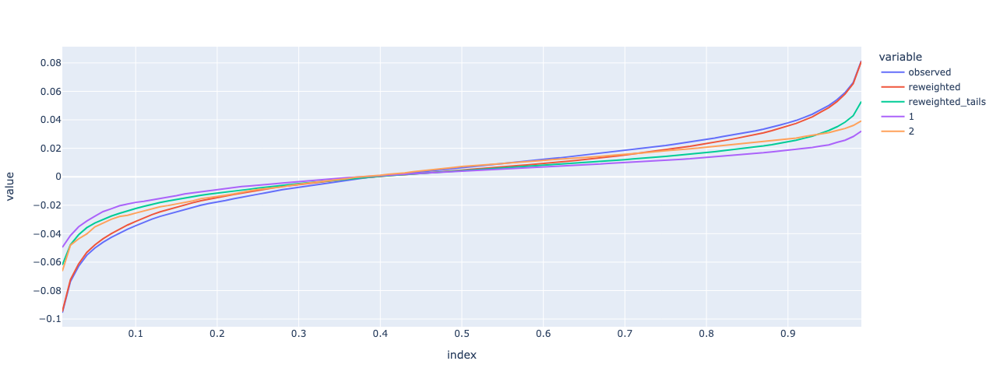

In [683]:
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor.csv')
adj_factor_hist.columns = ['Date','quantile_backtest']
adj_factor_hist = adj_factor_hist.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

adj_factor_hist = adj_factor_hist.join(model_obj.y)
adj_factor_hist = adj_factor_hist.assign(
    adj_factor_decile = lambda x: x.quantile_backtest
        .rank(pct = True).multiply(5).apply(np.floor).add(1).astype(int).replace({6:5})
)

adj_factor_bounds = adj_factor_hist.groupby('adj_factor_decile').quantile_backtest.agg(['max','min'])
display(adj_factor_bounds)

adj_factor_quintiles = adj_factor_hist.groupby(
    'adj_factor_decile'
).pct_delta_ahead.apply(
    lambda x: x.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])
).unstack(0)

px.line(model_obj.quantiles.join(adj_factor_quintiles[[1,2]]),height = 500)

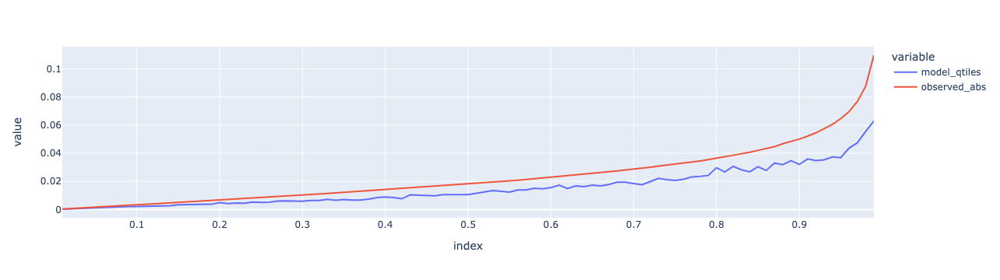

In [684]:
px.line(model_obj.model_qtiles)

### Fit historical

#### Single value (why it doesn't work)

In [9]:
model_obj = model.Model(data.fillna(method = 'pad'),10)

In [250]:
def hist_fit(i):
    dt = model_obj.X.index[i]
    mod = GradientBoostingRegressor().fit(
        model_obj.X.iloc[:i-1].values,
        model_obj.y.abs().iloc[:i-1].values.ravel()
    )
    return (dt, mod.predict(model_obj.X.iloc[i,:].values.reshape(1, -1)))

In [251]:
model_obj = model.Model(data.fillna(method = 'pad'),10)

hist_out = Parallel(
    n_jobs=-1,
    verbose = 5
)(delayed(hist_fit)(i) for i in range(4500,model_obj.X.shape[0]))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:   36.7s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 628 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 862 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1132 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 1438 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 2158 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 2572 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 2898 out of 2898 | elapsed: 13.6min finished


In [298]:
hist_out_df = pd.DataFrame(hist_out,columns = ['Date','model_vol']).set_index('Date')
hist_out_df['model_vol'] = hist_out_df.model_vol.apply(lambda x: x[0])
hist_out_df = hist_out_df.join(model_obj.X['VIX']).join(model_obj.y.abs())

NameError: name 'hist_out' is not defined

In [10]:
output = pd.read_csv('../horizon_10_adj_factor.csv')
output.columns = ['Date','quantile_backtest']
output = output.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

In [302]:
hist_out_df = hist_out_df.join(output).dropna()

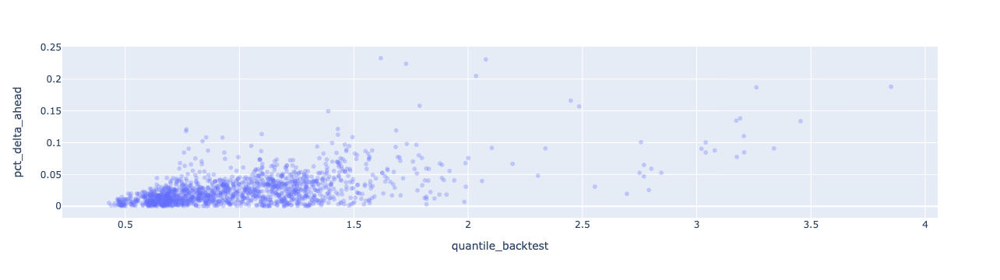

In [318]:
px.scatter(
    hist_out_df,
    x = 'quantile_backtest',
    y = 'pct_delta_ahead',
    opacity=0.3
)

In [296]:
hist_out_df.corr()

,model_vol,VIX,pct_delta_ahead,quantile_backtest
model_vol,1.000000,0.877533,0.503696,0.895934
VIX,0.877533,1.000000,0.464106,0.901020
pct_delta_ahead,0.503696,0.464106,1.000000,0.556279
quantile_backtest,0.895934,0.901020,0.556279,1.000000


#### Quantile historical runs

In [274]:
%%time

output = dict()
horizon = 20
model_obj = model.Model(data.fillna(method = 'pad'),horizon)

for dt in tqdm(model_obj.X.index):
    print(dt)
    model_obj = model.Model(
        data.fillna(method = 'pad'),
        horizon,
        eval_date=dt
    )
    model_obj.fit_quantiles()
    output[dt] = model_obj.adj_factor.copy()
    clear_output()
    
output = pd.Series(output,name = f'adj_factor_{horizon}')
output.to_csv(f'../horizon_{horizon}_adj_factor.csv')

100%|██████████| 7392/7392 [41:08:53<00:00, 20.04s/it]


CPU times: user 53min 56s, sys: 6min 56s, total: 1h 52s
Wall time: 1d 17h 8min 53s


In [188]:
output = pd.Series(output,name = f'adj_factor_{horizon}')

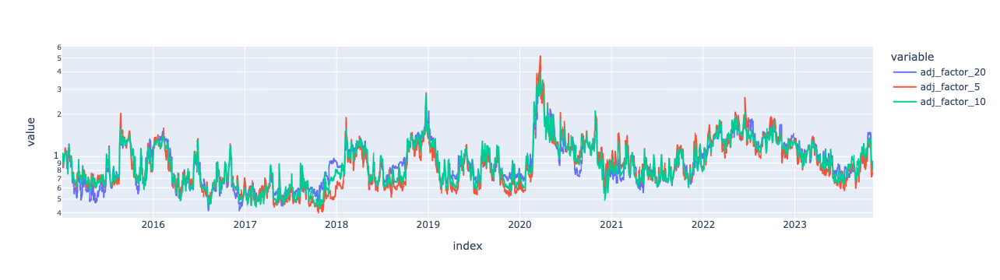

In [288]:
output_5 = pd.read_csv('../horizon_5_adj_factor.csv',index_col=0,parse_dates=True)
output_10 = pd.read_csv('../horizon_10_adj_factor.csv',index_col=0,parse_dates=True)
px.line(output.to_frame().join(output_5).join(output_10),log_y = True)

### Comparison to VIX

In [310]:
adj_factor_hist = pd.read_csv('../horizon_20_adj_factor.csv',index_col = 0, parse_dates = True)
adj_factor_hist = adj_factor_hist.join(model_obj.y.abs()).join(model_obj.X.VIX)

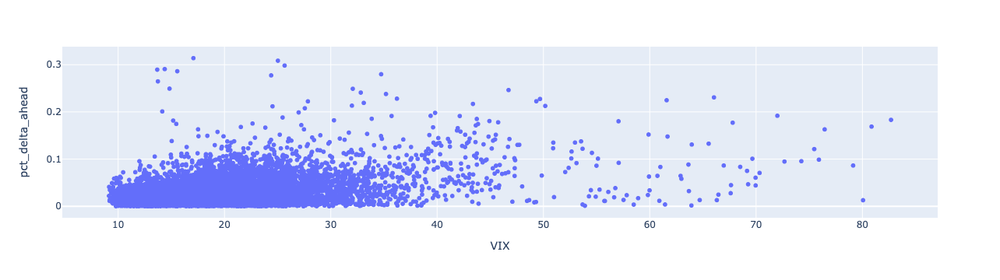

In [311]:
px.scatter(adj_factor_hist,x = 'VIX',y = 'pct_delta_ahead')

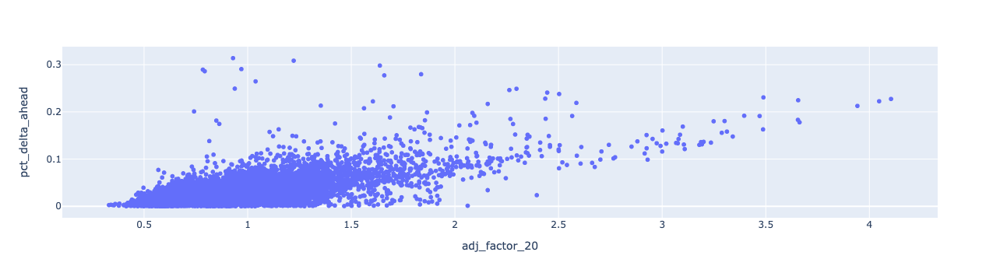

In [319]:
px.scatter(adj_factor_hist,x = 'adj_factor_20',y = 'pct_delta_ahead',hover_name=adj_factor_hist.index)

### Historical adjustment factor quintiles

In [12]:
adj_factor_hist = pd.read_csv('../horizon_10_adj_factor.csv')
adj_factor_hist.columns = ['Date','quantile_backtest']
adj_factor_hist = adj_factor_hist.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

adj_factor_hist = adj_factor_hist.join(model_obj.y)
adj_factor_hist = adj_factor_hist.assign(
    adj_factor_decile = lambda x: x.quantile_backtest
        .rank(pct = True).multiply(5).apply(np.floor).add(1).astype(int).replace({6:5})
)

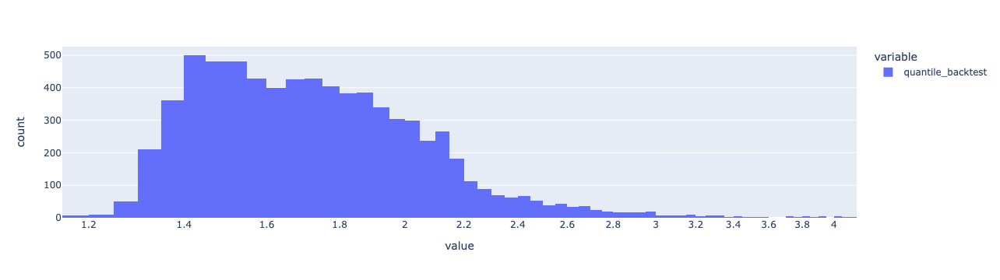

In [512]:
px.histogram(adj_factor_hist.quantile_backtest,log_x=True)

In [43]:
round(adj_factor_hist.shape[0]/10)

740

In [51]:
caliper = round(adj_factor_hist.shape[0]/10)
adj_factor_hist.loc[
    adj_factor_hist.sort_values('quantile_backtest').lt(model_obj.adj_factor)
]

,quantile_backtest,pct_delta_ahead,adj_factor_decile
Date,,,
2009-06-24,False,True,False
2019-01-04,False,True,False
2011-08-12,False,True,False
2010-08-26,False,True,False
2009-05-14,False,True,False
...,...,...,...
2009-03-06,False,True,False
2020-03-23,False,True,False
2008-11-20,False,True,False


In [45]:
adj_factor_hist.sort_values('quantile_backtest')

,quantile_backtest,pct_delta_ahead,adj_factor_decile
Date,,,
2014-07-03,0.389187,-0.002472,1
2006-10-20,0.420392,-0.002192,1
2014-07-02,0.422578,-0.007707,1
2006-10-26,0.426368,-0.004323,1
2006-10-25,0.429167,0.004048,1
...,...,...,...
2009-03-06,3.824794,0.113030,5
2020-03-23,3.939777,0.187979,5
2008-11-20,4.034364,0.165408,5


In [13]:
adj_factor_bounds = adj_factor_hist.groupby('adj_factor_decile').quantile_backtest.agg(['max','min'])
adj_factor_bounds

,max,min
adj_factor_decile,,
1,0.673044,0.389187
2,0.822748,0.673053
3,1.017545,0.822752
4,1.226863,1.017825
5,4.545350,1.227041


In [14]:
adj_factor_quintiles = adj_factor_hist.groupby(
    'adj_factor_decile'
).pct_delta_ahead.apply(
    lambda x: x.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])
).unstack(0)

adj_factor_quintiles

adj_factor_decile,1,2,3,4,5
0.01,-0.034856,-0.064154,-0.066703,-0.073427,-0.158735
0.02,-0.030775,-0.047749,-0.052866,-0.064429,-0.130259
0.03,-0.027194,-0.043479,-0.046762,-0.061089,-0.110792
0.04,-0.024224,-0.039652,-0.042084,-0.056299,-0.095577
0.05,-0.022249,-0.035411,-0.040204,-0.053040,-0.087527
...,...,...,...,...,...
0.95,0.021192,0.029832,0.036333,0.046385,0.081582
0.96,0.022353,0.030961,0.037487,0.048154,0.085279
0.97,0.024230,0.032571,0.039210,0.050283,0.091400
0.98,0.026124,0.033874,0.042212,0.053035,0.097900


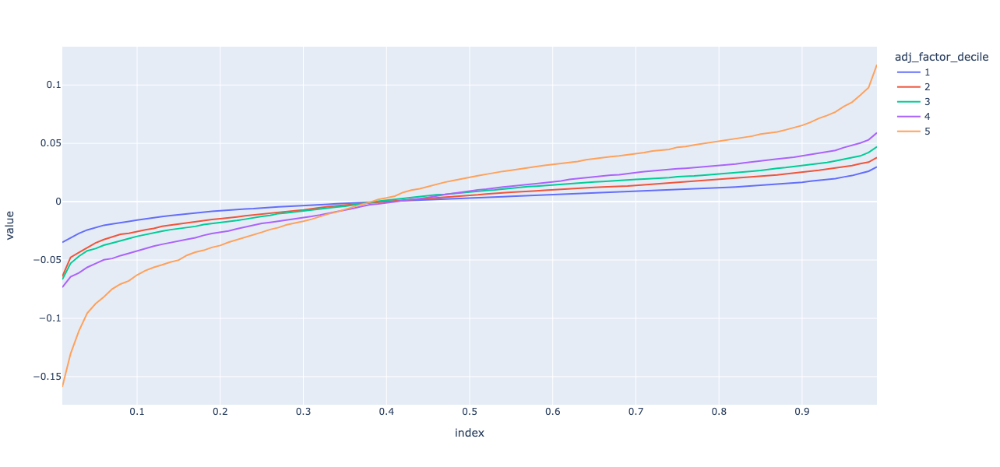

In [15]:
px.line(
    adj_factor_quintiles,
    height = 600
)

### Low/high times within quintiles

In [498]:
temp = output_10.join(model_obj.y).assign(
    af_low_quintile = lambda x: x.adj_factor_10.where(x.adj_factor_10.lt(x.adj_factor_10.quantile(.2))),
    delta_low_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).lt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.1))
    ),
    delta_hi_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).gt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.9))
    ),
)

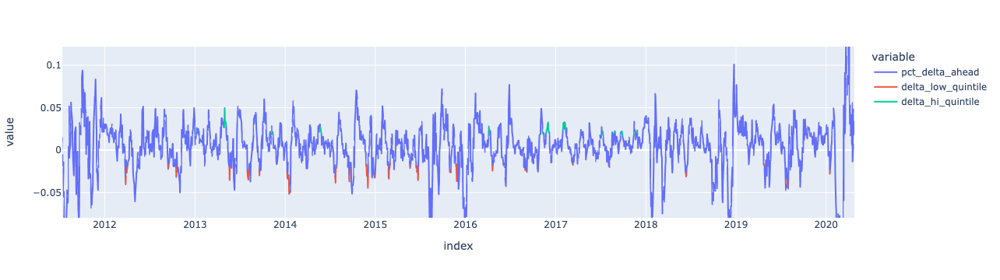

In [502]:
px.line(
    temp.filter(regex = 'delta')
)

In [500]:
temp

,adj_factor_10,pct_delta_ahead,af_low_quintile,delta_low_quintile,delta_hi_quintile
1994-07-05,0.989536,0.012905,NaN,NaN,NaN
1994-07-06,0.909043,0.009780,NaN,NaN,NaN
1994-07-07,0.829236,0.007652,NaN,NaN,NaN
1994-07-08,0.886934,0.009743,NaN,NaN,NaN
1994-07-11,1.049821,0.014665,NaN,NaN,NaN
...,...,...,...,...,...
2023-11-16,0.747421,0.019701,NaN,NaN,NaN
2023-11-17,0.682659,0.013088,NaN,NaN,NaN
2023-11-20,0.646113,0.005151,0.646113,NaN,NaN
2023-11-21,0.714054,0.003287,NaN,NaN,NaN


# Trade menu

In [16]:
adj_factor_quintiles.agg(['min','max']).add(1).multiply(data.Close[-1])

adj_factor_decile,1,2,3,4,5
min,452.971194,439.220448,438.024244,434.868365,394.831114
max,483.308334,487.109703,491.428968,497.050596,524.483729


In [17]:
data.Close[-1]

469.329987

In [18]:
menu = menus.TradeMenu(
    prices_df,
    data.Close[-1],
    adj_factor_quintiles[1],
    bounds = (446,484)
)

Write strategies complete
Spreads and straddles complete
Calculating 91308 Iron Condors...
Iron condors complete


In [659]:
balance = 63_000
kelly = 0.28
E_loss = 22.48#4.989928

balance * kelly / (E_loss*100)

7.846975088967971

In [19]:
menu.menu.sort_values('EV',ascending =False)\
    .loc[
    menu.menu.EV.gt(0)
    #& menu.menu.win_pct.gt(.7)
].head(50)# menu.menu.cost.lt(0) &

cost  \
strategy    leg_1 leg_2 leg_3 leg_4         
Iron condor 446.0 470.0 470.0 484.0 -6.40   
            447.0 470.0 470.0 484.0 -6.39   
            446.0 469.0 470.0 484.0 -5.98   
            448.0 470.0 470.0 484.0 -6.38   
            446.0 471.0 471.0 484.0 -6.33   
                  470.0 471.0 484.0 -5.85   
                  469.0 469.0 484.0 -6.57   
            447.0 469.0 470.0 484.0 -5.97   
            449.0 470.0 470.0 484.0 -6.37   
            447.0 471.0 471.0 484.0 -6.32   
                  470.0 471.0 484.0 -5.84   
                  469.0 469.0 484.0 -6.56   
            448.0 469.0 470.0 484.0 -5.96   
                  471.0 471.0 484.0 -6.31   
            446.0 469.0 471.0 484.0 -5.43   
            448.0 470.0 471.0 484.0 -5.83   
                  469.0 469.0 484.0 -6.55   
            449.0 469.0 470.0 484.0 -5.95   
            450.0 470.0 470.0 484.0 -6.35   
            449.0 471.0 471.0 484.0 -6.30   
            446.0 468.0 470.0 484.0 -5.61   
            447.0 469.0 471.0 484.0 -5.42   
            449.0 470.0 471.0 484.0 -5.82   
                  469.0 469.0 484.0 -6.54   
            446.0 468.0 469.0 484.0 -6.20   
            451.0 470.0 470.0 484.0 -6.34   
            447.0 468.0 470.0 484.0 -5.60   
            446.0 471.0 472.0 484.0 -5.84   
            448.0 469.0 471.0 484.0 -5.41   
            446.0 470.0 470.0 483.0 -6.33   
                        472.0 484.0 -5.36   
            450.0 469.0 470.0 484.0 -5.93   
            447.0 468.0 469.0 484.0 -6.19   
            450.0 471.0 471.0 484.0 -6.28   
            448.0 468.0 470.0 484.0 -5.59   
            447.0 471.0 472.0 484.0 -5.83   
            449.0 469.0 471.0 484.0 -5.40   
            446.0 472.0 472.0 484.0 -6.38   
            450.0 470.0 471.0 484.0 -5.80   
            446.0 468.0 471.0 484.0 -5.06   
                  467.0 470.0 484.0 -5.30   
            447.0 470.0 470.0 483.0 -6.32   
                        472.0 484.0 -5.35   
            450.0 469.0 469.0 484.0 -6.52   
            451.0 469.0 470.0 484.0 -5.92   
            448.0 468.0 469.0 484.0 -6.18   
            452.0 470.0 470.0 484.0 -6.32   
            451.0 471.0 471.0 484.0 -6.27   
            449.0 468.0 470.0 484.0 -5.58   
            446.0 468.0 468.0 484.0 -6.84   

                                                                             quantiles  \
strategy    leg_1 leg_2 leg_3 leg_4                                                      
Iron condor 446.0 470.0 470.0 484.0  0.01   -0.106288
0.02   -0.087138
0.03   -0.07...   
            447.0 470.0 470.0 484.0  0.01   -0.106388
0.02   -0.087238
0.03   -0.07...   
            446.0 469.0 470.0 484.0  0.01   -0.100488
0.02   -0.081338
0.03   -0.06...   
            448.0 470.0 470.0 484.0  0.01   -0.106488
0.02   -0.087338
0.03   -0.07...   
            446.0 471.0 471.0 484.0  0.01   -0.116988
0.02   -0.097838
0.03   -0.08...   
                  470.0 471.0 484.0  0.01   -0.111788
0.02   -0.092638
0.03   -0.07...   
                  469.0 469.0 484.0  0.01   -0.094588
0.02   -0.075438
0.03   -0.05...   
            447.0 469.0 470.0 484.0  0.01   -0.100588
0.02   -0.081438
0.03   -0.06...   
            449.0 470.0 470.0 484.0  0.01   -0.106588
0.02   -0.087438
0.03   -0.07...   
            447.0 471.0 471.0 484.0  0.01   -0.117088
0.02   -0.097938
0.03   -0.08...   
                  470.0 471.0 484.0  0.01   -0.111888
0.02   -0.092738
0.03   -0.07...   
                  469.0 469.0 484.0  0.01   -0.094688
0.02   -0.075538
0.03   -0.05...   
            448.0 469.0 470.0 484.0  0.01   -0.100688
0.02   -0.081538
0.03   -0.06...   
                  471.0 471.0 484.0  0.01   -0.117188
0.02   -0.098038
0.03   -0.08...   
            446.0 469.0 471.0 484.0  0.01   -0.105988
0.02   -0.086838
0.03   -0.07...   
            448.0 470.0 471.0 484.0  0.01   -0.111988
0.02   -0.092838
0.03   -0.07...   
                  469.0 469.0 484.0  0.01   -0.094788
0.02   -0.075638
0.03 

In [72]:
463/454.6

1.01847778266608

In [23]:
menu.menu.sort_values('win_pct',ascending =False)\
    .loc[
    menu.menu.EV.gt(0)
    #& menu.menu.win_pct.gt(.7)
].head(50)# menu.menu.cost.lt(0) &

cost  \
strategy         leg_1 leg_2 leg_3 leg_4         
Bull put spread  446.0 451.0 NaN   NaN   -0.05   
                 448.0 452.0 NaN   NaN   -0.05   
cash covered put 446.0 NaN   NaN   NaN   -0.21   
                 447.0 NaN   NaN   NaN   -0.22   
                 449.0 NaN   NaN   NaN   -0.24   
                 450.0 NaN   NaN   NaN   -0.26   
                 451.0 NaN   NaN   NaN   -0.27   
                 452.0 NaN   NaN   NaN   -0.29   
                 453.0 NaN   NaN   NaN   -0.32   
Bull put spread  448.0 451.0 NaN   NaN   -0.03   
                       453.0 NaN   NaN   -0.08   
                       450.0 NaN   NaN   -0.02   
                 451.0 453.0 NaN   NaN   -0.04   
                 449.0 450.0 NaN   NaN   -0.01   
                       451.0 NaN   NaN   -0.02   
                       452.0 NaN   NaN   -0.04   
                 451.0 452.0 NaN   NaN   -0.01   
                 449.0 453.0 NaN   NaN   -0.07   
                 450.0 452.0 NaN   NaN   -0.02   
                 446.0 452.0 NaN   NaN   -0.07   
covered call     484.0 NaN   NaN   NaN   -0.23   
cash covered put 448.0 NaN   NaN   NaN   -0.23   
Bull put spread  450.0 453.0 NaN   NaN   -0.05   
                 447.0 450.0 NaN   NaN   -0.03   
                       449.0 NaN   NaN   -0.01   
                 446.0 453.0 NaN   NaN   -0.10   
                       448.0 NaN   NaN   -0.01   
                 447.0 452.0 NaN   NaN   -0.06   
                       453.0 NaN   NaN   -0.09   
                       451.0 NaN   NaN   -0.04   
                 446.0 449.0 NaN   NaN   -0.02   
                       450.0 NaN   NaN   -0.04   
                 448.0 455.0 NaN   NaN   -0.14   
Iron condor      448.0 451.0 482.0 484.0 -0.16   
                 450.0 453.0 483.0 484.0 -0.10   
                             482.0 484.0 -0.18   
                                   483.0 -0.11   
                 449.0 453.0 482.0 483.0 -0.13   
Bull put spread  446.0 455.0 NaN   NaN   -0.16   
Iron condor      448.0 451.0 482.0 483.0 -0.09   
                 451.0 453.0 483.0 484.0 -0.09   
                 448.0 451.0 483.0 484.0 -0.08   
                 449.0 453.0 483.0 484.0 -0.12   
                 451.0 453.0 482.0 484.0 -0.17   
                                   483.0 -0.10   
Bull put spread  446.0 454.0 NaN   NaN   -0.12   
                 449.0 454.0 NaN   NaN   -0.09   
Iron condor      446.0 451.0 482.0 483.0 -0.11   
                 449.0 452.0 483.0 484.0 -0.09   
                             482.0 484.0 -0.17   

                                                                                  quantiles  \
strategy         leg_1 leg_2 leg_3 leg_4                                                      
Bull put spread  446.0 451.0 NaN   NaN    0.01    0.0005
0.02    0.0005
0.03    0.0005
0...   
                 448.0 452.0 NaN   NaN    0.01    0.0005
0.02    0.0005
0.03    0.0005
0...   
cash covered put 446.0 NaN   NaN   NaN    0.01    0.0021
0.02    0.0021
0.03    0.0021
0...   
                 447.0 NaN   NaN   NaN    0.01    0.0022
0.02    0.0022
0.03    0.0022
0...   
                 449.0 NaN   NaN   NaN    0.01    0.0024
0.02    0.0024
0.03    0.0024
0...   
                 450.0 NaN   NaN   NaN    0.01    0.0026
0.02    0.0026
0.03    0.0026
0...   
                 451.0 NaN   NaN   NaN    0.01    0.0027
0.02    0.0027
0.03    0.0027
0...   
                 452.0 NaN   NaN   NaN    0.01    0.0029
0.02    0.0029
0.03    0.0029
0...   
                 453.0 NaN   NaN   NaN    0.01    0.002912
0.02    0.003200
0.03    0.00...   
Bull put spread  448.0 451.0 NaN   NaN    0.01    0.0003
0.02    0.0003
0.03    0.0003
0...   
                       453.0 NaN   NaN    0.01    0.000512
0.02    0.000800
0.03    0.00...   
                       450.0 NaN   NaN    0.01    0.0002
0.02    0.0002
0.03    0.0002
0...   
                 451.0 453.0 NaN   NaN    0.01    0.000112
0.02    0.000400
0.03    0.00...   
                

## Visualization

### Bull put spread

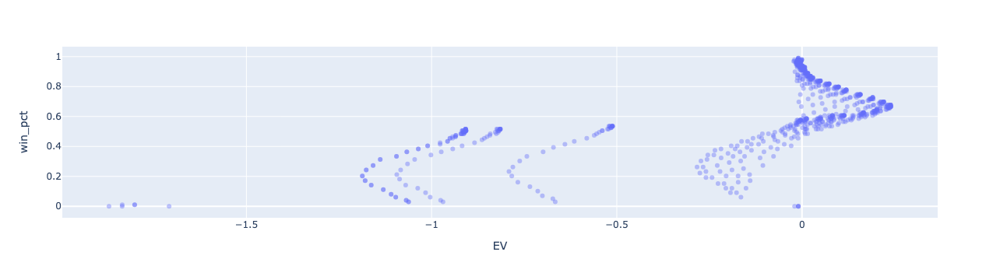

In [691]:
px.scatter(
    data_frame = menu.menu.loc['Bull put spread'].sort_values('win_pct',ascending =False).reset_index(),
    x = 'EV',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.4
)

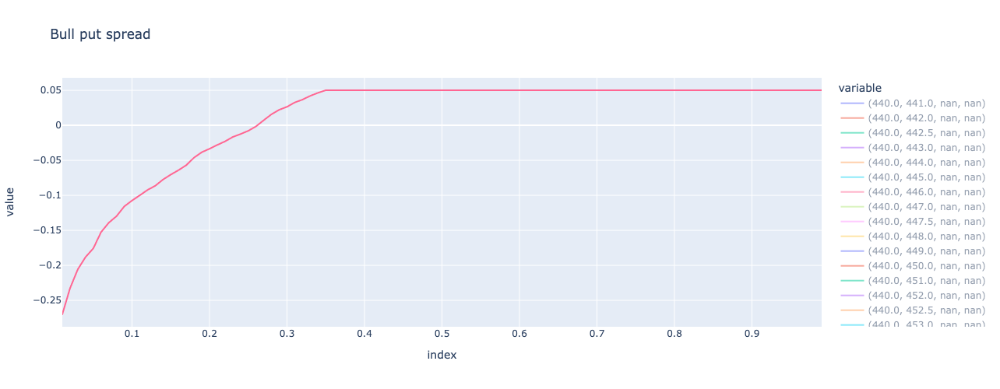

In [649]:
strategy = 'Bull put spread'
val1 = 440
val2 = 472

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,:],'quantiles'].droplevel(0,axis = 0)

df = pd.concat([i for i in menu_slice],axis=1)
df.columns = [str(i) for i in menu_slice.index.to_flat_index()]

px.line(df,height = 500,title = strategy)

In [24]:
menu.menu.loc[pd.IndexSlice['Bull put spread',456]].sort_values('win_pct',ascending = False)

/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/ipykernel_5689/861555165.py:1: PerformanceWarning:

indexing past lexsort depth may impact performance.



,,,cost,quantiles,EV,E_pct,win_pct,E_win,E_loss,kelly_criteria
leg_2,leg_3,leg_4,,,,,,,,
457.0,NaN,NaN,-0.04,0.01 -0.009600 0.02 -0.009600 0.03 -0.00...,0.015272,NaN,0.969697,0.040000,0.770930,0.385659
458.0,NaN,NaN,-0.09,0.01 -0.019100 0.02 -0.019100 0.03 -0.01...,0.034381,NaN,0.969697,0.089592,1.720930,0.387623
459.0,NaN,NaN,-0.16,0.01 -0.028400 0.02 -0.028400 0.03 -0.02...,0.062559,NaN,0.959596,0.158819,2.207979,0.397879
460.0,NaN,NaN,-0.24,0.01 -0.037600 0.02 -0.037600 0.03 -0.03...,0.090208,NaN,0.949495,0.238350,2.676823,0.382292
461.0,NaN,NaN,-0.33,0.01 -0.046700 0.02 -0.046700 0.03 -0.04...,0.112209,NaN,0.929293,0.329420,2.726536,0.344067
462.0,NaN,NaN,-0.45,0.01 -0.055500 0.02 -0.055500 0.03 -0.04...,0.143779,NaN,0.909091,0.448940,2.891859,0.323498
463.0,NaN,NaN,-0.59,0.01 -0.064100 0.02 -0.064100 0.03 -0.05...,0.176605,NaN,0.898990,0.583512,3.427211,0.305715
464.0,NaN,NaN,-0.75,0.01 -0.072500 0.02 -0.072500 0.03 -0.06...,0.205902,NaN,0.878788,0.739536,3.645793,0.281232
465.0,NaN,NaN,-0.95,0.01 -0.080500 0.02 -0.080500 0.03 -0.07...,0.248030,NaN,0.858586,0.931327,3.882846,0.269009


### Iron Condors

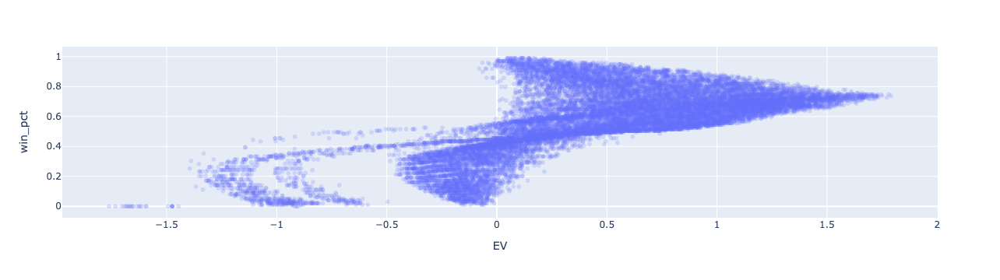

In [21]:
px.scatter(
    data_frame = menu.menu.loc['Iron condor'].sort_values('win_pct',ascending =False).reset_index().sample(10000),
    x = 'EV',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2
)

In [ ]:
446.0	470.0	470.0	484.0	

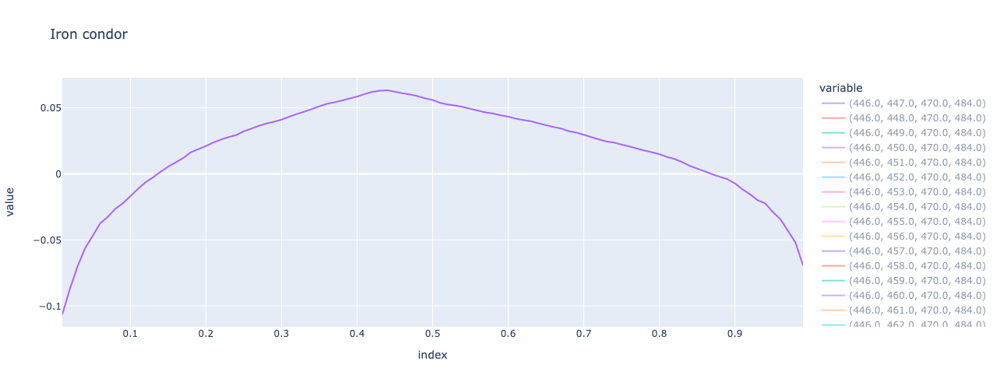

In [22]:
strategy = 'Iron condor'
val1 = 446
val2 = 470
val3 = 470
val4 = 484

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,:,val3,val4],'quantiles'].droplevel(0,axis = 0)

df = pd.concat([i for i in menu_slice],axis=1)
df.columns = [str(i) for i in menu_slice.index.to_flat_index()]

px.line(df,height = 500,title = strategy)

In [25]:
menu.menu.loc[pd.IndexSlice[strategy,val1,:,val3,val4],:]

cost  \
strategy    leg_1 leg_2 leg_3 leg_4         
Iron condor 446.0 447.0 470.0 484.0 -3.64   
                  448.0 470.0 484.0 -3.65   
                  449.0 470.0 484.0 -3.66   
                  450.0 470.0 484.0 -3.68   
                  451.0 470.0 484.0 -3.69   
                  452.0 470.0 484.0 -3.71   
                  453.0 470.0 484.0 -3.74   
                  454.0 470.0 484.0 -3.76   
                  455.0 470.0 484.0 -3.80   
                  456.0 470.0 484.0 -3.84   
                  457.0 470.0 484.0 -3.89   
                  458.0 470.0 484.0 -3.94   
                  459.0 470.0 484.0 -4.01   
                  460.0 470.0 484.0 -4.09   
                  461.0 470.0 484.0 -4.18   
                  462.0 470.0 484.0 -4.30   
                  463.0 470.0 484.0 -4.44   
                  464.0 470.0 484.0 -4.60   
                  465.0 470.0 484.0 -4.80   
                  466.0 470.0 484.0 -5.03   
                  467.0 470.0 484.0 -5.30   
                  468.0 470.0 484.0 -5.61   
                  469.0 470.0 484.0 -5.98   
                  470.0 470.0 484.0 -6.40   

                                                                             quantiles  \
strategy    leg_1 leg_2 leg_3 leg_4                                                      
Iron condor 446.0 447.0 470.0 484.0  0.01    0.036400
0.02    0.036400
0.03    0.03...   
                  448.0 470.0 484.0  0.01    0.036500
0.02    0.036500
0.03    0.03...   
                  449.0 470.0 484.0  0.01    0.036600
0.02    0.036600
0.03    0.03...   
                  450.0 470.0 484.0  0.01    0.036800
0.02    0.036800
0.03    0.03...   
                  451.0 470.0 484.0  0.01    0.036900
0.02    0.036900
0.03    0.03...   
                  452.0 470.0 484.0  0.01    0.037100
0.02    0.037100
0.03    0.03...   
                  453.0 470.0 484.0  0.01    0.037112
0.02    0.037400
0.03    0.03...   
                  454.0 470.0 484.0  0.01    0.027312
0.02    0.037600
0.03    0.03...   
                  455.0 470.0 484.0  0.01    0.017712
0.02    0.036862
0.03    0.03...   
                  456.0 470.0 484.0  0.01    0.008112
0.02    0.027262
0.03    0.03...   
                  457.0 470.0 484.0  0.01   -0.001388
0.02    0.017762
0.03    0.03...   
                  458.0 470.0 484.0  0.01   -0.010888
0.02    0.008262
0.03    0.02...   
                  459.0 470.0 484.0  0.01   -0.020188
0.02   -0.001038
0.03    0.01...   
                  460.0 470.0 484.0  0.01   -0.029388
0.02   -0.010238
0.03    0.00...   
                  461.0 470.0 484.0  0.01   -0.038488
0.02   -0.019338
0.03   -0.00...   
                  462.0 470.0 484.0  0.01   -0.047288
0.02   -0.028138
0.03   -0.01...   
                  463.0 470.0 484.0  0.01   -0.055888
0.02   -0.036738
0.03   -0.01...   
                  464.0 470.0 484.0  0.01   -0.064288
0.02   -0.045138
0.03   -0.02...   
                  465.0 470.0 484.0  0.01   -0.072288
0.02   -0.053138
0.03   -0.03...   
                  466.0 470.0 484.0  0.01   -0.079988
0.02   -0.060838
0.03   -0.04...   
                  467.0 470.0 484.0  0.01   -0.087288
0.02   -0.068138
0.03   -0.05...   
                  468.0 470.0 484.0  0.01   -0.094188
0.02   -0.075038
0.03   -0.05...   
                  469.0 470.0 484.0  0.01   -0.100488
0.02   -0.081338
0.03   -0.06...   
                  470.0 470.0 484.0  0.01   -0.106288
0.02   -0.087138
0.03   -0.07...   

                                           EV  E_pct   win_pct     E_win  \
strategy    leg_1 leg_2 leg_3 leg_4                                        
Iron condor 446.0 447.0 470.0 484.0  1.232443    NaN  0.717172  2.936112   
                  448.0 470.0 484.0  1.242343    NaN  0.717172  2.946112   
                  449.0 470.0 484.0  1.252243    NaN  0.717172  2.956112   
                  450.0 470.0 484.0  1.272043    NaN  0.717172  2.976112   
                  451.0 470.0 484.0  1.281943    NaN  0.717172  2.986

### Long Straddles

/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/ipykernel_25116/3613671719.py:3: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



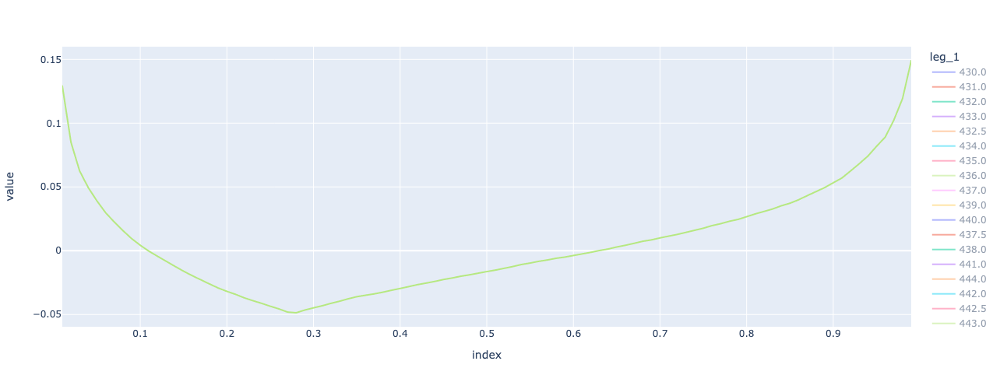

In [20]:
strategy = 'Long straddle'

df = pd.concat([i for i in menu.menu.loc[strategy].quantiles],1)
df.columns = menu.menu.loc[strategy].index.get_level_values(0)

px.line(df,height = 500)

# Maker menu

In [514]:
horizon = 22
temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)

temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,horizon+1)
],axis = 1).dropna().cumprod(1)

In [515]:
adj_factor_bounds

,max,min
adj_factor_decile,,
1,0.661213,0.330854
2,0.830924,0.661253
3,1.008487,0.830972
4,1.230522,1.008491
5,4.104313,1.230721


In [558]:
quintile = 2

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

In [517]:
temp = temp.loc[af_filter]

In [518]:
temp_qtile = pd.concat([
    temp.quantile(n/100) for n in range(5,100,5)
],axis = 1)

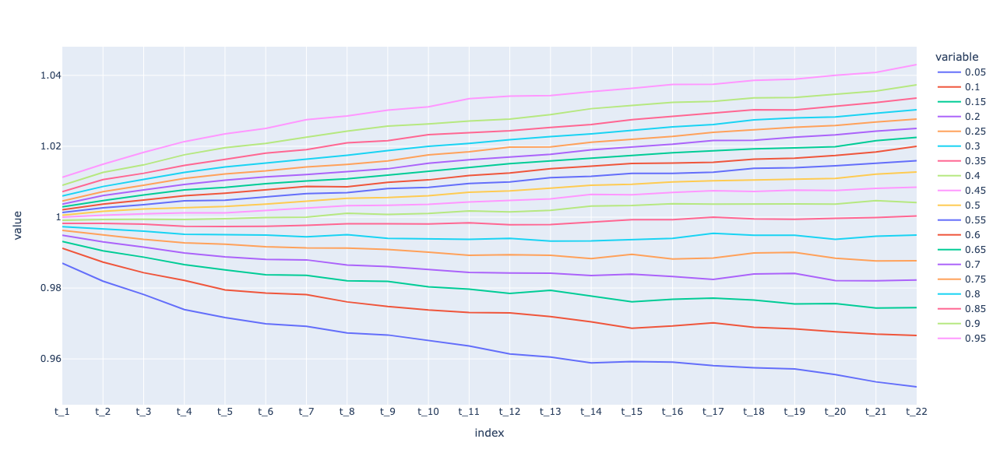

In [519]:
px.line(temp_qtile,height = 600)

In [552]:
temp.gt(1.01).cumsum(1).gt(0).mean()

t_1     0.077131
t_2     0.184032
t_3     0.269959
t_4     0.352503
t_5     0.418133
t_6     0.470230
t_7     0.523004
t_8     0.560893
t_9     0.592693
t_10    0.629905
t_11    0.656969
t_12    0.677267
t_13    0.697564
t_14    0.715832
t_15    0.729364
t_16    0.744249
t_17    0.755074
t_18    0.765900
t_19    0.774019
t_20    0.778755
t_21    0.787551
t_22    0.793640
dtype: float64

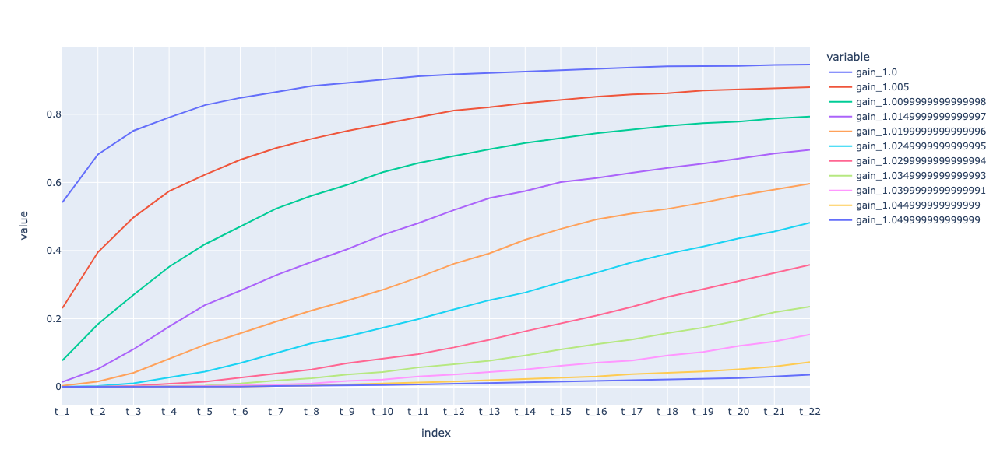

In [521]:
px.line(pd.concat([
    temp.gt(i).cumsum(1).gt(0).mean().rename(f'gain_{i}') for i in np.arange(1,1.05,0.005)
],axis = 1),height = 600)

## Black Scholes

S : current asset price

K: strike price of the option

r: risk free rate 

T : time until option expiration 

σ: annualized volatility of the asset's returns 

risk-free rate historical: https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=on&txtcolor=%23444444&ts=12&tts=12&width=1138&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=DGS1MO&scale=left&cosd=2001-07-31&coed=2023-11-30&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=2&ost=-99999&oet=99999&mma=0&fml=a&fq=Daily&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date=2023-12-02&revision_date=2023-12-02&nd=2001-07-31

In [77]:
def BlackScholes(option_type,S,K,T,r,sigma):
    N = norm.cdf
    d1 = (np.log(S/K) + (r + sigma**2/2)*T) / (sigma*np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    if option_type == 'call':
        return S * N(d1) - K * np.exp(-r*T)* N(d2)
    elif option_type == 'put':
        return K*np.exp(-r*T)*N(-d2) - S*N(-d1)
    else:
        print('Unrecognized option type')

In [613]:
BlackScholes(
    'call',
    S = data.Close[-1],
    K = 475,
    T = 20/365,
    r = 0.0554,
    sigma = 0.0974
)

3.569497552526343

In [614]:
prices_df.loc[('C',475)]

Contract Name            SPY240112C00475000
Last Trade Date       2023-12-14 4:14PM EST
Last Price                             3.84
Bid                                    3.79
Ask                                    3.83
Change                                 0.28
% Change                             +7.87%
Volume                                 4578
Open Interest                          2432
Implied Volatility                    9.74%
Name: (C, 475.0), dtype: object

In [619]:
strike = 475
price = 3.83
risk_free = 0.0554
vol = 0.0974
time = 20
targets = [round(i,2) for i in np.arange(1.2,5.2,0.2)]
quintile = 2

temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)
temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,time+1)
],axis = 1).dropna().cumprod(1)

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

temp = temp.loc[af_filter]

bs_ex = temp.copy()
bs_ex.columns = [i for i in range(time,0,-1)]
bs_ex = bs_ex.multiply(data.Close[-1])

bs_ex = bs_ex.apply(
    lambda x: BlackScholes(
        'call',
        S = x,
        K = strike,
        T = (x.name-1)/365,
        r = risk_free,
        sigma = vol
    )
).div(price)

bs_ex.columns = temp.columns

bs_ex_cum = pd.concat([
    bs_ex.gt(i).cumsum(1).gt(0).mean().rename(i) for i in targets
],axis = 1)
bs_ex_cum.columns.rename('Targets',inplace = True)

bs_ex_pv = bs_ex_cum.iloc[-1].to_frame()

bs_ex_pv = bs_ex_pv.reset_index().assign(
    target_miss_payout = [temp[bs_ex_pv.columns[0]].multiply(data.Close[-1]).add(-strike).apply(lambda x: np.maximum(x,0)).div(price)[
        ~bs_ex.gt(i).cumsum(1).gt(0)[bs_ex_pv.columns[0]]
    ].mean()-1 for i in targets],
    EV = lambda x: x[bs_ex_pv.columns[0]]*(x.Targets-1)+(1-x[bs_ex_pv.columns[0]])*x.target_miss_payout
).set_index('Targets')

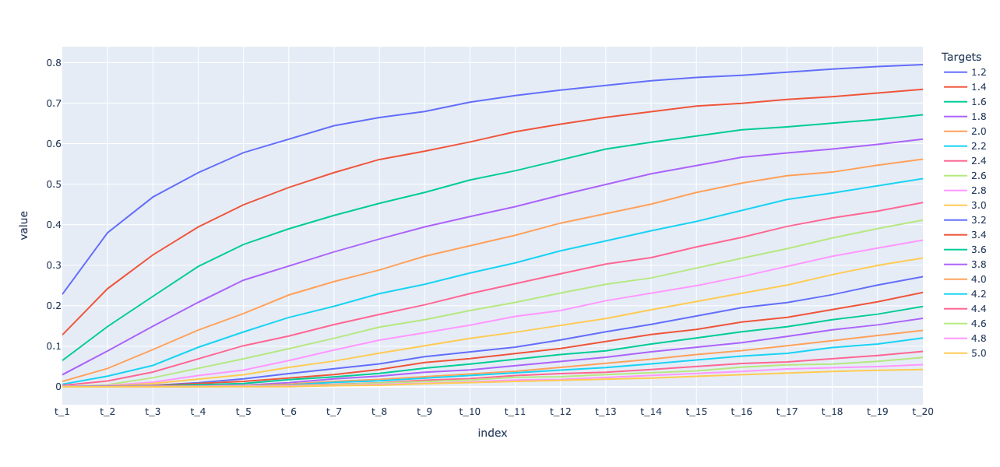

In [620]:
px.line(bs_ex_cum,height = 600)

In [623]:
bs_ex_pv

,t_20,target_miss_payout,EV
Targets,,,
1.2,0.794993,-0.929385,-0.031532
1.4,0.734100,-0.907686,0.052287
1.6,0.671177,-0.874472,0.115160
1.8,0.610961,-0.821485,0.169179
2.0,0.561570,-0.789318,0.215509
2.2,0.513532,-0.726442,0.262847
2.4,0.454668,-0.637215,0.289042
2.6,0.411367,-0.574988,0.319730
2.8,0.361976,-0.481196,0.344541


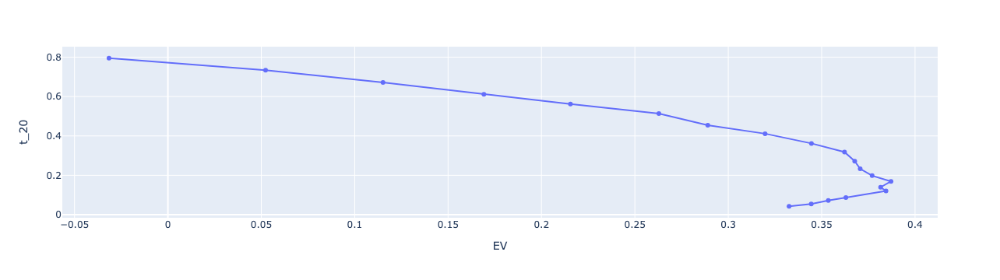

In [631]:
px.line(
    bs_ex_pv,
    y = 't_20',
    x = 'EV',
    markers = True,
    hover_name=bs_ex_pv.index
)

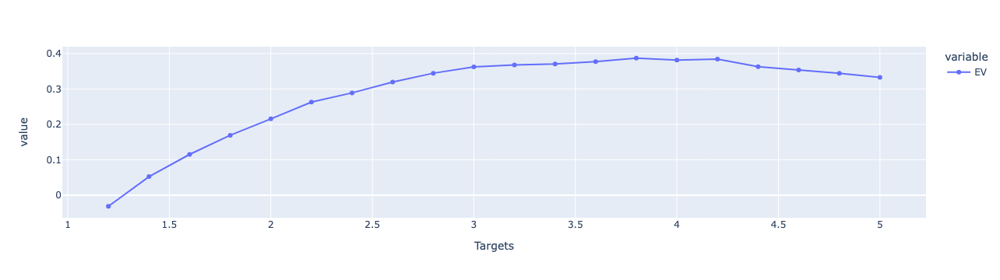

In [621]:
px.line(bs_ex_pv.EV,markers=True)

# Kelly Criterion test

In [ ]:
446.0	470.0	470.0	484.0	

In [26]:
strategy = 'Iron condor'
val1 = 446
val2 = 470
val3 = 470
val4 = 484

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],'quantiles']


In [27]:
menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],:]

cost                                                           -6.4
quantiles         0.01   -0.106288
0.02   -0.087138
0.03   -0.07...
EV                                                         1.800585
E_pct                                                           NaN
win_pct                                                    0.737374
E_win                                                      3.608628
E_loss                                                     3.206588
kelly_criteria                                             0.504007
Name: (Iron condor, 446.0, 470.0, 470.0, 484.0), dtype: object

In [28]:
menu_slice.min()*100

-10.628806055480004

In [29]:
portfolio = 6e4
kc = 0.4
E_loss = menu_slice.min()*-100

portfolio*kc/(E_loss*100)

22.580146702014634

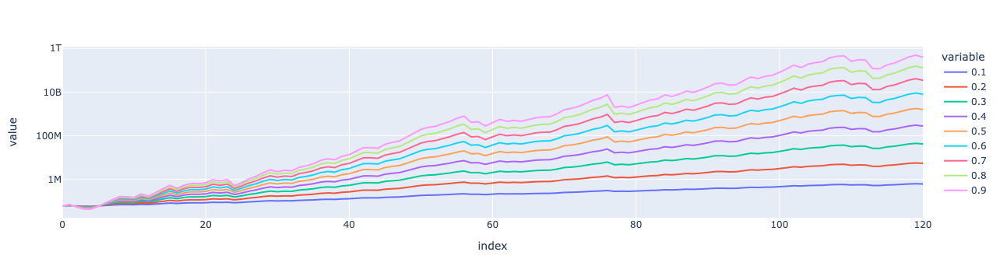

In [30]:
portfolio = 6e4
kc = 0.3
E_loss = menu_slice.min()*-100#7.295421
time = 24*5

outcome = pd.DataFrame(index = range(time+1),columns = [round(i,1) for i in np.arange(0.1,1,0.1)])
outcome.loc[:,'payouts'] = menu_slice.sample(time+1,replace = True).values
outcome.loc[0,:] = portfolio

for j in [round(i,1) for i in np.arange(0.1,1,0.1)]:
    for i in outcome.index[1:]:
        outcome.loc[i,j] = np.max([
            outcome.loc[i-1,j] 
            + round(outcome.loc[i-1,j]*j/(E_loss*100),0)
            * outcome.loc[i,'payouts']*10000,
            0
        ])
        
px.line(outcome.drop(columns = 'payouts'),log_y = True)

In [31]:
portfolio = 6e4
value_at_risk = [round(i,2) for i in np.arange(0.1,1,0.05)]
E_loss = menu_slice.min()*-100#7.295421
time = 24
iterations = 1_000
kc_output = pd.DataFrame(index = range(iterations),columns = value_at_risk)

for n in tqdm(range(iterations)):
    outcome = pd.DataFrame(index = range(time+1),columns = value_at_risk)
    outcome.loc[:,'payouts'] = menu_slice.sample(time+1,replace = True).values
    outcome.loc[0,:] = portfolio

    for j in value_at_risk:
        for i in outcome.index[1:]:
            if outcome.loc[i-1,j]*j/(E_loss*100) < 0:
                outcome.loc[i,j] = 0
            else:
                outcome.loc[i,j] = np.max([
                    outcome.loc[i-1,j] 
                    + round(outcome.loc[i-1,j]*j/(E_loss*100),0)
                    * outcome.loc[i,'payouts']*10000,
                    0
                ])
    
    kc_output.loc[n,:] = outcome.loc[time,:].drop(columns = 'payouts')

100%|██████████| 1000/1000 [00:30<00:00, 33.16it/s]


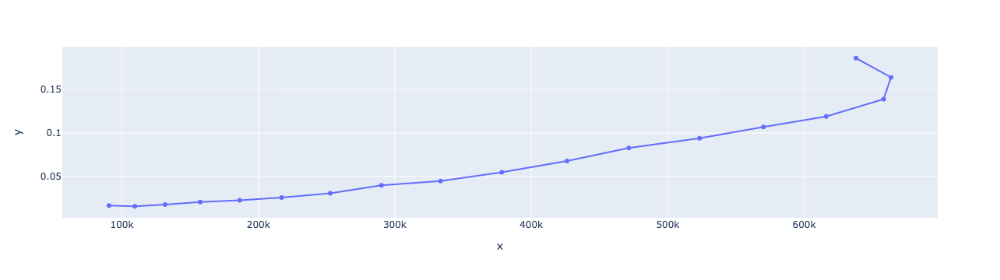

In [33]:
px.line(
    x = kc_output.median(),
    y = kc_output.lt(portfolio).mean(),
    hover_name=kc_output.columns,
    markers=True,
)

In [35]:
kc = 0.55
contracts = round(portfolio*kc/(E_loss*100))

print(f'''
Kelly criterion: {round(kc*100)}%
Contracts: {contracts}
Max loss: (${round(E_loss*100*contracts)})
Max gain: ${round(menu_slice.max()*10000*contracts)}''')


Kelly criterion: 55%
Contracts: 31
Max loss: ($32949)
Max gain: $19620


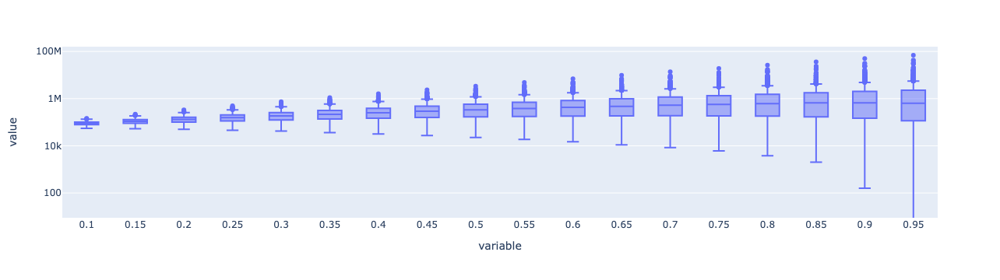

In [36]:
px.box(kc_output,log_y = True)